In [1]:
import os
from glob import glob
import pandas as pd
import plotly.express as px
from PIL import Image, ImageDraw
import numpy as np

# PPEs Image Dataset Data Analysis

This notebook performs exploratory analysis on Personal Protective Equipment Dataset (v4) from Roboflow ([source](https://universe.roboflow.com/personal-protective-equipment/ppes-kaxsi/dataset/4)). Dataset contains annottaions and images presenting objects belonging to one of the following classes:
- goggles
- helmet
- mask
- no-suit
- no_goggles
- no_helmet
- no_mask
- no_shoes
- shoes
- suit
- no_glove
- glove

Annotations contains info about image size, detected classes and coordinates of the detection area (bounding box). Dataset (after pre-processing) can be used for the object detection problem. 

## Read and inspect dataset

Get basic info about number of the dataset structure and number of examples.  

In [2]:
# Directory setup
BASE_DIR = "PPEs.v4-raw.tensorflow"
TRAIN_DIR = os.path.join(BASE_DIR, "train")
VAL_DIR = os.path.join(BASE_DIR, "valid")
TRAIN_ANNOTATIONS_FILEPATH = os.path.join(TRAIN_DIR, "_annotations.csv")
VAL_ANNOTATIONS_FILEPATH = os.path.join(VAL_DIR, "_annotations.csv")
os.listdir(BASE_DIR)

['README.roboflow.txt', 'valid', 'README.dataset.txt', '.DS_Store', 'train']

In [3]:
# basic info about the number of examples

train_img_names = glob(TRAIN_DIR+"/*.jpg")
val_img_names = glob(VAL_DIR+"/*.jpg")
print(f"Number of training images: {len(train_img_names)}")
print(f"Number of validation images: {len(val_img_names)}")
print(f"Total number of images: {len(train_img_names) + len(val_img_names)}")

Number of training images: 9611
Number of validation images: 2367
Total number of images: 11978


As we can see, image dataset is divided into training and validation sets, where the validation set constitutes about 20% of the total dataset.

In [4]:
# read and concatenate both datasets into one dataframe to simplify visualizations and to not double data analysis. 

train_annot_df = pd.read_csv(TRAIN_ANNOTATIONS_FILEPATH)
val_annot_df = pd.read_csv(VAL_ANNOTATIONS_FILEPATH)

train_annot_df["mode"] = "training"
val_annot_df["mode"] = "validation"

annotations = pd.concat([train_annot_df, val_annot_df], ignore_index=True)

annotations

,filename,width,height,class,xmin,ymin,xmax,ymax,mode
0,kp1737_jpg.rf.78a83ac82adaa308fa023354c4d091a4...,1280,720,no_goggles,509,541,582,576,training
1,packing1020_jpg.rf.7949b2c00e93d76df0fe29034dc...,1280,720,no_goggles,934,246,1003,279,training
2,packing1020_jpg.rf.7949b2c00e93d76df0fe29034dc...,1280,720,no_goggles,183,249,239,278,training
3,packing1020_jpg.rf.7949b2c00e93d76df0fe29034dc...,1280,720,no_goggles,840,469,966,519,training
4,img273_jpg.rf.78e6836c24c899b455bb6079eb65ae34...,1280,720,glove,153,314,307,427,training
...,...,...,...,...,...,...,...,...,...
24572,img262_jpg.rf.fe1954895b561ea61b3d8a4b30a64505...,1280,720,no_glove,151,1,189,104,validation
24573,img262_jpg.rf.fe1954895b561ea61b3d8a4b30a64505...,1280,720,glove,132,252,228,383,validation
24574,img262_jpg.rf.fe1954895b561ea61b3d8a4b30a64505...,1280,720,glove,385,313,486,487,validation
24575,img262_jpg.rf.fe1954895b561ea61b3d8a4b30a64505...,1280,720,glove,810,368,954,484,validation


We can confirm there is 12 classes as in the dataset description.

In [5]:
classes = set(annotations["class"])

print(f"Unique classes: \n {classes}")
print(f"Total: {len(classes)}")

Unique classes: 
 {'shoes', 'suit', 'goggles', 'no_helmet', 'no_goggles', 'no_mask', 'mask', 'glove', 'no_glove', 'no-suit', 'no_shoes', 'helmet'}
Total: 12


## Check for NaN values

Checking for the existance of missing values in a dataset is crucial before feeding data into the ml/deep-learning model, as it would introduce additional bias and deteriorate the detection results. Usually (in computer vision problems) rows (and related images) with missing values are removed from dataset, but sometimes, in case of numerical types, those values can be filled with some specific numbers. 

As we can see below there is 24577 non-null out of 24577 entries, so there is no null values in the whole dataset. 

In [6]:
annotations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24577 entries, 0 to 24576
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  24577 non-null  object
 1   width     24577 non-null  int64 
 2   height    24577 non-null  int64 
 3   class     24577 non-null  object
 4   xmin      24577 non-null  int64 
 5   ymin      24577 non-null  int64 
 6   xmax      24577 non-null  int64 
 7   ymax      24577 non-null  int64 
 8   mode      24577 non-null  object
dtypes: int64(6), object(3)
memory usage: 1.7+ MB


In [7]:
# double-check for NaN values in dataframe
annotations.isnull().any()

filename    False
width       False
height      False
class       False
xmin        False
ymin        False
xmax        False
ymax        False
mode        False
dtype: bool

## Visualize example image

Img pixel range: (0 - 255)


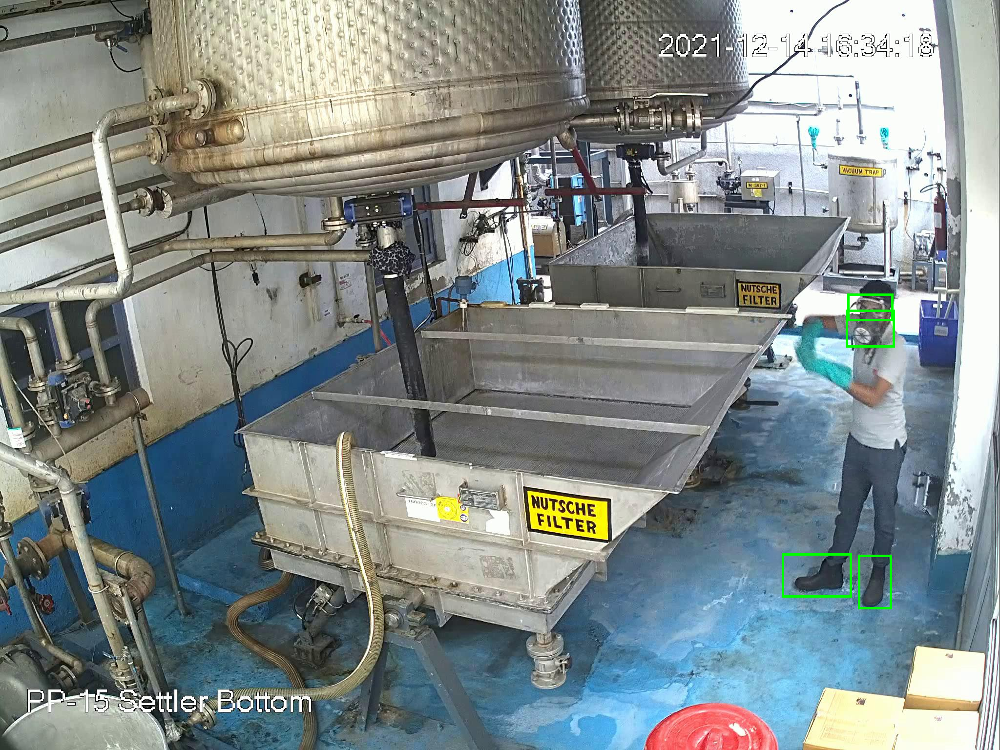

In [8]:
example = annotations[annotations["filename"] == annotations.iloc[200,0]]
img = Image.open(os.path.join(TRAIN_DIR, annotations.iloc[200,0]))

print(f"Img pixel range: ({np.min(img)} - {np.max(img)})")

draw = ImageDraw.Draw(img)
xres, yres = img.size[0], img.size[1]
for i in range(len(example)):
    draw.rectangle([int(example.iloc[i]['xmin']),
                            int(example.iloc[i]['ymin']),
                            int(example.iloc[i]['xmax']),
                            int(example.iloc[i]['ymax'])], width=5, outline=(0,255,0))

img

## Describe statistical data for the number of detected objects (classes) per image

Both datasets have similar average number of detected objects per image (around 2) and standard deviation. 
Max number of objects per image is higher in training set, than in validation set. 

In [9]:
print("Descriptive stats for class distribution in training set")
print(annotations[annotations["mode"]=="training"].groupby("filename")["class"].count().reset_index(name="class count").describe().T)
print("-"*70)
print("Descriptive stats for class distribution in validation set")
print(annotations[annotations["mode"]=="validation"].groupby("filename")["class"].count().reset_index(name="class count").describe().T)

Descriptive stats for class distribution in training set
              count      mean       std  min  25%  50%  75%   max
class count  9611.0  2.048486  1.420139  1.0  1.0  1.0  3.0  13.0
----------------------------------------------------------------------
Descriptive stats for class distribution in validation set
              count      mean       std  min  25%  50%  75%   max
class count  2367.0  2.065484  1.443915  1.0  1.0  1.0  3.0  10.0


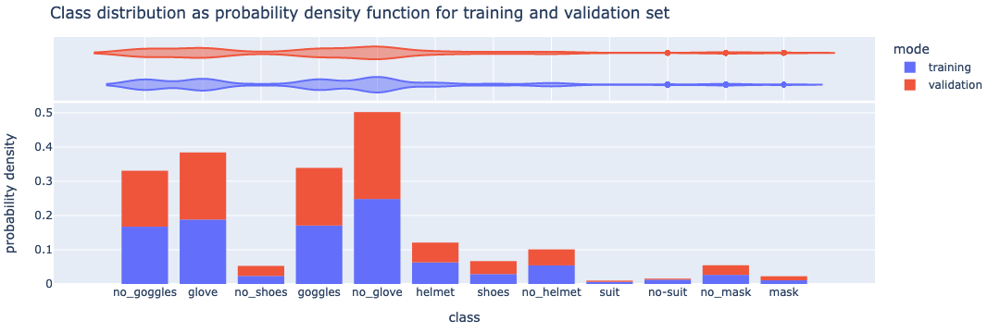

In [10]:
# Probability density distribution of objects with given class in both datasets.

fig = px.histogram(annotations,
                   x="class",
                   marginal="violin",
                   histnorm="probability density",
                   color="mode",
                   title="Class distribution as probability density function for training and validation set",
                   )
fig.update_layout(
    margin=dict(l=20, r=20, t=40, b=20)
)
fig.show()

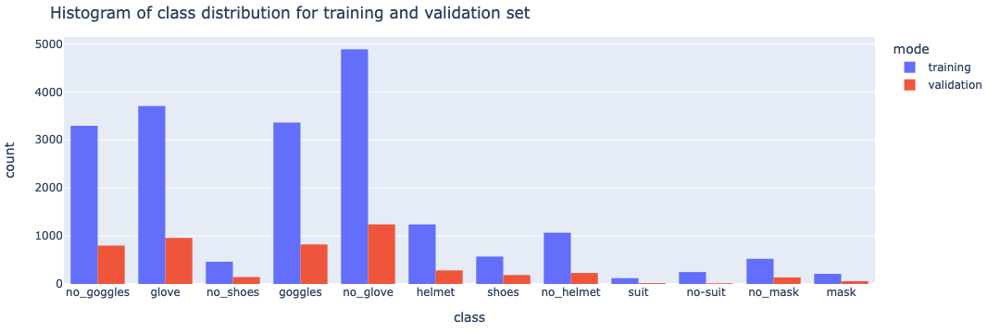

In [11]:
fig = px.histogram(annotations,
                   x="class",
                   color="mode",
                   title="Histogram of class distribution for training and validation set",
                   barmode="group"
                  )
fig.update_layout(
    margin=dict(l=20, r=20, t=40, b=20)
)
fig.show()

The presented histograms confirm that the dataset is highly unbalanced. The classes related to `suit` and `mask` are not well represented in both training and validation sets.
The analysis of the probability density distribution shows that images in both datasets: training and validation come from the same distribution (there is proportional number of objects from each class in both datasets).

---

To further check how informative are images (how many distinct objects are on a single picture), we can look at the percentage distribution of the number of unique classes per image.

As we can see, most images have only 1 unique type of the objects, which means (comparing with the avg number of objects per image), most images have multiple objects of the same class.  

In [12]:
unique_objects_per_image = annotations.groupby(["filename", "mode"])["class"].apply(lambda x: len(set(x))).reset_index(name="unique_object_count")
unique_objects_per_image.tail()

,filename,mode,unique_object_count
11973,packing993_jpg.rf.5c9816afb38473cba75aba011518...,training,1
11974,packing995_jpg.rf.5d0460faefc88b04d45dc83b3d76...,training,1
11975,packing998_jpg.rf.e870d670e12ca1529e11baf7d5bb...,training,1
11976,packing99_jpg.rf.7959b5b58bb56b71dae8c9391211a...,training,1
11977,packing9_jpg.rf.31516452db900146232cbca80d19c4...,training,2


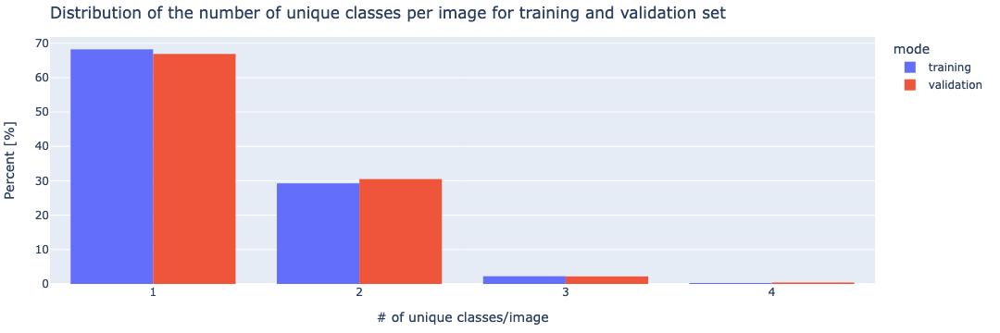

In [13]:
fig = px.histogram(unique_objects_per_image,
                   x="unique_object_count",
                   color="mode",
                   title="Distribution of the number of unique classes per image for training and validation set",
                   barmode="group",
                   histnorm="percent",
                   
                  )
fig.update_layout(
    margin=dict(l=20, r=20, t=40, b=20),
    xaxis_title='# of unique classes/image',
    yaxis_title='Percent [%]'
)
fig.show()

## Describe statistical data for the image parameters: width, height, detection coordinates


To properly analyze image size parameters (width, height) we can use datafram with removed duplicated rows based on image filename (such rows existed due to multiple classes on single image). 

In [14]:
# filter out duplicated rows based on unique filenames 
unique_filenames = annotations.drop_duplicates(subset=["filename"]).reset_index(drop=True)
unique_filenames

,filename,width,height,class,xmin,ymin,xmax,ymax,mode
0,kp1737_jpg.rf.78a83ac82adaa308fa023354c4d091a4...,1280,720,no_goggles,509,541,582,576,training
1,packing1020_jpg.rf.7949b2c00e93d76df0fe29034dc...,1280,720,no_goggles,934,246,1003,279,training
2,img273_jpg.rf.78e6836c24c899b455bb6079eb65ae34...,1280,720,glove,153,314,307,427,training
3,NVR-09_Trim_new_Trim-0202_jpg.rf.7920cea3e1be1...,1920,1080,no_shoes,1639,946,1726,991,training
4,packing1432_jpg.rf.78fc7f726b995d1bd091b0aff38...,1280,720,no_goggles,882,173,969,218,training
...,...,...,...,...,...,...,...,...,...
11973,packing1924_jpg.rf.fe0528a3d202d6bb6ebe58dbf99...,1280,720,no_goggles,965,137,1040,186,validation
11974,NX_img_6_jpg.rf.fec4d06567eb25c44b1a39140a6163...,1280,720,no_helmet,93,145,205,237,validation
11975,img306_jpg.rf.ffe98435bbe29b0d7969ee02d0d8d166...,1280,720,glove,120,237,210,351,validation
11976,img211_jpg.rf.fd568889a355cfaaae7f316f8a6e8974...,1280,720,no_glove,750,65,902,115,validation


Descriptive stats for `width` and `height` parameters

In [15]:
unique_filenames[unique_filenames["mode"]=="training"].iloc[:, [1, 2]].describe().T

,count,mean,std,min,25%,50%,75%,max
width,9611.0,1410.608053,377.555702,200.0,1280.0,1280.0,1280.0,2688.0
height,9611.0,843.067111,306.916353,199.0,720.0,720.0,720.0,1536.0


In [16]:
unique_filenames[unique_filenames["mode"]=="validation"].iloc[:, [1, 2]].describe().T

,count,mean,std,min,25%,50%,75%,max
width,2367.0,1418.806084,374.194181,310.0,1280.0,1280.0,1280.0,2688.0
height,2367.0,845.209548,301.302624,217.0,720.0,720.0,720.0,1536.0



To properly analyze the parameters like image width and height we can use the image aspect ratio calculated as follows:

aspect_ratio = $\frac{width}{height}$

Below, we can see distribution of the number of images with the calculated aspect ratios for both datasets in a log scale.

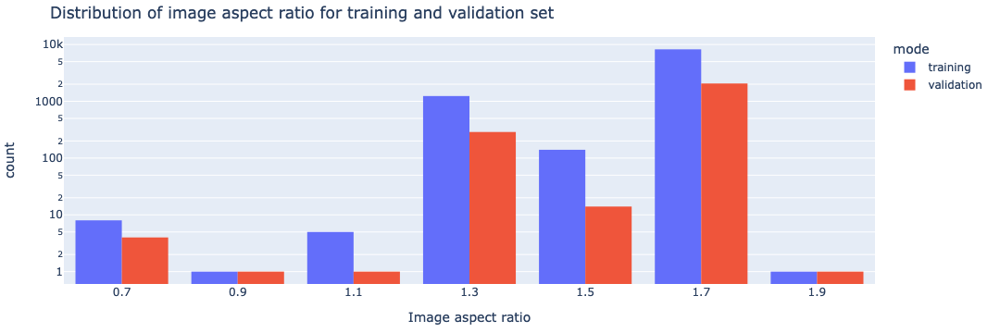

In [17]:
unique_filenames["aspect_ratio"] = unique_filenames["width"]/unique_filenames["height"]

fig = px.histogram(unique_filenames,
                   x="aspect_ratio",
                   color="mode",
                   title="Distribution of image aspect ratio for training and validation set",
                   barmode="group",
                   log_y=True,
                   nbins=10
                  )
fig.update_layout(
    margin=dict(l=20, r=20, t=40, b=20),
    xaxis_title='Image aspect ratio',
)
fig.show()

We can also look at height parameter as the function of image width for each class, to check how distributed are image sizes in both datasets.

In most cases, the values for training and validation set overlap, which means the images (for the specific class) have the same sizes in both datasets. Visible single dots, like e.g. for `class=mask` do not indicate an error, which is further investigated on the example heatmaps below. 

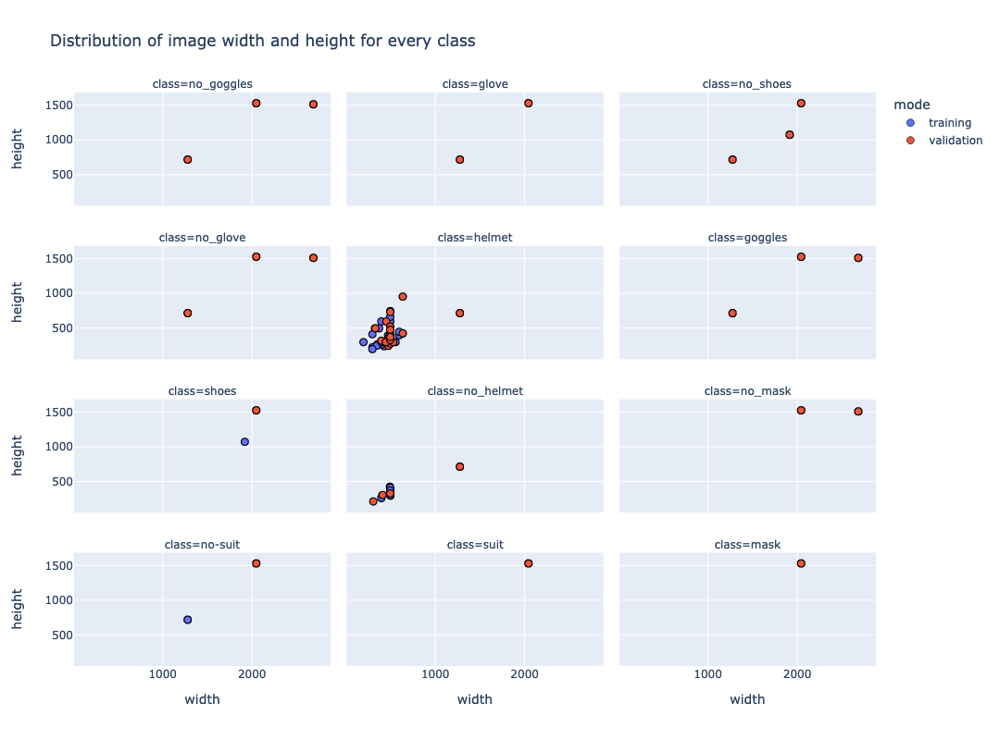

In [18]:
fig = px.scatter(unique_filenames,
                 x="width",
                 y="height",
                 color="mode",
                 facet_col="class",
                 facet_col_wrap=3,
                 width=1000,
                 height=800,
                 title="Distribution of image width and height for every class",
                 )
fig.update_traces(marker=dict(size=8,
                              line=dict(width=1,
                                        color='DarkSlateGrey'),
                             ),
                  selector=dict(mode='markers'),
                  )


fig.show()

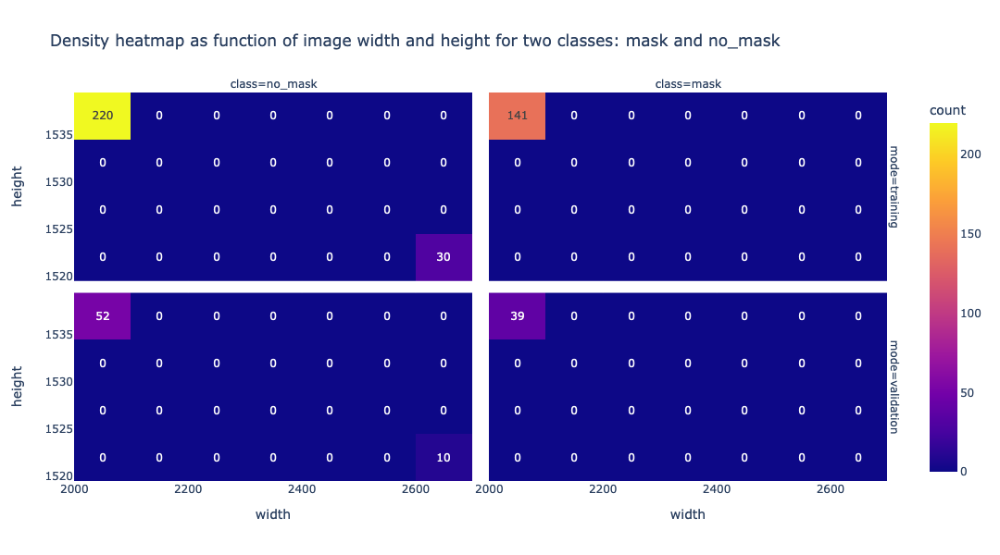

In [19]:
fig = px.density_heatmap(unique_filenames[unique_filenames["class"].isin(["no_mask", "mask"])],
                         x="width",
                         y="height",
                         facet_row="mode",
                         facet_col="class",
                         width=1000,
                         height=600,
                         text_auto=True,
                         nbinsx=8,
                         nbinsy=8,
                         title="Density heatmap as function of image width and height for two classes: mask and no_mask"
                        )

fig.show()

The heatmaps above confirm, that, the visible "single dots"
are just overlapping values for training and validation sets, indicating the images from both sets have the same size.

### Calculating bounary box area to perform descriptive analysis on those parameters
The **detection area** (boundary box) is calculated using rectangle area formula:

box_area = $(y_{max} - y_{min}) \cdot (x_{max} - x_{min})$


The **aspect ratio** of the box can be calculated as follows:

box_aspect_ratio = $\frac{x_{max} - x_{min}}{y_{max} - y_{min}}$

**When analyzing bounding box parameters, we go back to the `annotations` dataframe to consider all boxes.**

In [20]:
# calculate box area and box_aspect_ratio in separate columns

annotations["box_area"] = (annotations["ymax"]-annotations["ymin"]) * (annotations["xmax"]-annotations["xmin"])
annotations["box_aspect_ratio"] = (annotations["xmax"]-annotations["xmin"])/(annotations["ymax"]-annotations["ymin"])


The percentage distribution of detection box area was based on original box sizes, hence the large numbers and, for better visualization, the logarithmic scale. Nevertheless, only two groups of bars on the chart below exceed 10% of the entire dataset (with the box area <20k), so the dataset is dominated by smaller detection areas. Large bounding boxes constitute only <1% in the dataset. 


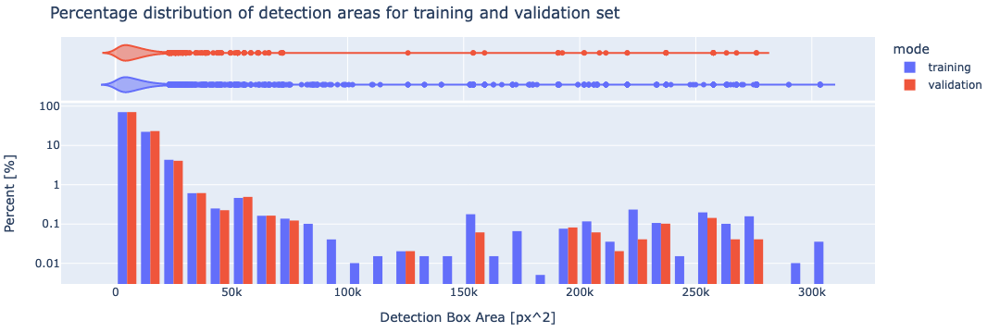

In [21]:
fig = px.histogram(annotations,
                   x="box_area",
                   marginal="violin",
                   histnorm="percent",
                   color="mode",
                   title="Percentage distribution of detection areas for training and validation set",
                   barmode="group",
                   log_y=True,
                   nbins= 60
                  )
fig.update_layout(
    margin=dict(l=20, r=20, t=40, b=20),
    xaxis_title='Detection Box Area [px^2]',
    yaxis_title='Percent [%]'
)
fig.show()

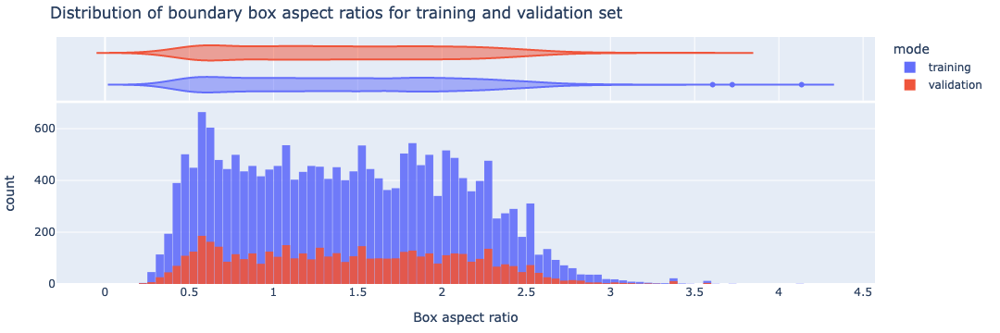

In [22]:
fig = px.histogram(annotations,
                   x="box_aspect_ratio",
                   marginal="violin",
                   color="mode",
                   title="Distribution of boundary box aspect ratios for training and validation set",
                   barmode='overlay',
                   opacity=0.90,
                  )
fig.update_layout(
    margin=dict(l=20, r=20, t=40, b=20),
    xaxis_title='Box aspect ratio',
    bargap=0.05,
)
fig.show()

The distribution of the box aspect ratio parameter visualize the more uniform course, with much smaller tail with parameters with larger values. 

---

In the end, we can further inspect the bounding box area depending on classes. As we can see, bounding boxes related to `suit` and `no-suit` classes have the largest average area (which makes sense).


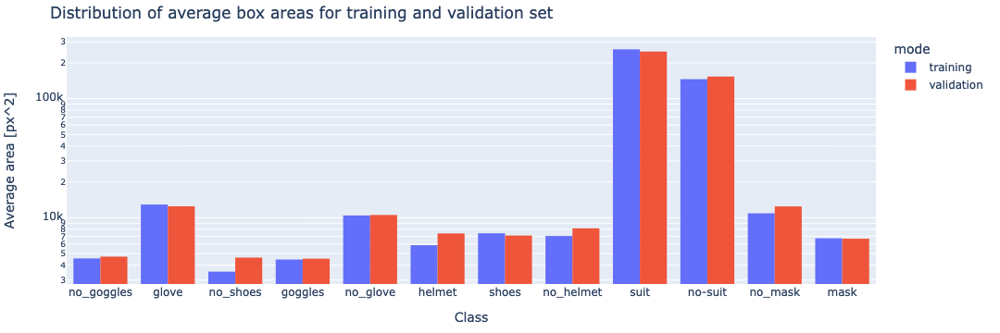

In [23]:
fig = px.histogram(annotations,
                   x="class",
                   y="box_area",
                   histfunc="avg",
                   color="mode",
                   title="Distribution of average box areas for training and validation set",
                   barmode="group",
                   log_y=True,
                  )
fig.update_layout(
    margin=dict(l=20, r=20, t=40, b=20),
    xaxis_title='Class',
    yaxis_title='Average area [px^2]'
)
fig.show()

## Summary

Analyzed dataset consists of the collection of raw images, that need to be preprocessed before performing model training. 
There is no missing values in the dataset, so there is no need to fill/remove redundant rows. Images are divided into training and validation set with the split ratio: 0.20, both from the same distribution. Initially, I would assess the overall number of examples as sufficient to perform model training, but first training results (learning curves) should evaluate it more visibly. 

Preprocessing steps, worth considering:

- Resolve unbalanced class problem. Example strategies (applied only for training dataset):
    - perform data augmentation (creating new examples using transformations like e.g. image flipping, resizing, etc.) on images with unbalanced classes to increase number of examples belonging to these classes (in our example classes like `suit`, `no_suit`, `mask`, `no_mask`). Example python library that can be used in this case: `Albumentations`. 
    - introduce some weights to model loss function (not really data preprocessing step, but still solution to class imbalance problem), that e.g. penalizes over-represented classes)
    - custom image cropping (e.g. to reduce number of majority classes per image) that would rebalance the dataset on the object level
    - undersampling majority class (via Random Selection).

- Standardize the image size. Every ML/DL model accepts images of a uniform size as input.
    - the simplest approach is to resize the entire dataset to L x L format using e.g. `cv2` or `Pillow` python library. We need to also resize the boundary box coordinates respectively, for instance, new `xmin`,`ymin` could be calculated as:\
      `new_xmin = round((xmin / width) * new_width)` \
      `new_ymin = round((ymin / height) * new_height)`
      but keep in mind, this is destructive resizing, that changes aspect ratio.
    - to do non-destructive resizing, we can consider choosing the proper, fixed image size and add padding.
- before feeding the image to the model, we should also consider image normalization (making the pixel values range from (0-255) to (0-1)), to make the computations faster and easier.
